In [2]:
"""This module contains simple helper functions """
from __future__ import print_function
import torch
import numpy as np
from PIL import Image
import os
from dataset import dataset_single
from torch.utils.data import DataLoader
import sys
import matplotlib.pyplot as plt
np.set_printoptions(threshold=sys.maxsize)
from torchvision.utils import make_grid
import matplotlib as mpl
import importlib
mpl.rcParams.update({'figure.max_open_warning': 0})

from taming_comb.modules.style_encoder.network import *
from taming_comb.modules.diffusionmodules.model import * 

def get_obj_from_str(string, reload=False):
    module, cls = string.rsplit(".", 1)
    if reload:
        module_imp = importlib.import_module(module)
        importlib.reload(module_imp)
    return getattr(importlib.import_module(module, package=None), cls)



def instantiate_from_config(config):
    if not "target" in config:
        raise KeyError("Expected key `target` to instantiate.")
    return get_obj_from_str(config["target"])(**config.get("params", dict()))


             
def tensor2im(input_image, imtype=np.uint8):
    """"Converts a Tensor array into a numpy image array.

    Parameters:
        input_image (tensor) --  the input image tensor array
        imtype (type)        --  the desired type of the converted numpy array
    """
    if not isinstance(input_image, np.ndarray):
        if isinstance(input_image, torch.Tensor):  # get the data from a variable
            image_tensor = input_image.data
        else:
            return input_image
        image_numpy = image_tensor[0].clamp(-1.0, 1.0).cpu().float().numpy()  # convert it into a numpy array
        if image_numpy.shape[0] == 1:  # grayscale to RGB
            image_numpy = np.tile(image_numpy, (3, 1, 1))
        image_numpy = (np.transpose(image_numpy, (1, 2, 0)) + 1) / 2.0 * 255.0  # post-processing: tranpose and scaling
    else:  # if it is a numpy array, do nothing
        image_numpy = input_image
    return image_numpy.astype(imtype)


def show_3(img1, img2, img3):
    f = plt.figure(figsize=(12, 8))
    ax = f.add_subplot(1,3,1)
    fig = plt.imshow(img1)
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    
    ax = f.add_subplot(1,3,2)
    fig = plt.imshow(img2)
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    
    ax = f.add_subplot(1,3,3)
    fig = plt.imshow(img3)  
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    
def show_4(img1, img2, img3, img4):
    f = plt.figure(figsize=(12, 8))
    ax = f.add_subplot(1,4,1)
    fig = plt.imshow(img1)
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    
    ax = f.add_subplot(1,4,2)
    fig = plt.imshow(img2)
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False)
    
    ax = f.add_subplot(1,4,3)
    fig = plt.imshow(img3)  
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False) 
    
    ax = f.add_subplot(1,4,4)
    fig = plt.imshow(img4)  
    fig.axes.get_xaxis().set_visible(False)
    fig.axes.get_yaxis().set_visible(False) 

def load_eval_model(_path, config_file, ed, ne, target, img_size):
    from omegaconf import OmegaConf
    config = OmegaConf.load(config_file)
    # print(config.model.params.n_embed)
    config.model.target = target
    config.model.z_channels = img_size
    config.model.resolution = img_size
    config.model.params.n_embed = ne
    config.model.params.embed_dim = ed
    model_a = instantiate_from_config(config.model)
    ck = torch.load(_path, map_location=device)
    model_a.load_state_dict(ck['model_state_dict'], strict=False)
    model_a = model_a.to(device)
    return model_a.eval()


def visualize(m, _class, img_size, mode='train', num_test=20, dataset='afhq'):
    
    root = '/home/jenny/VQVAE-CUT/dataset/{}'.format(dataset)
    # data loader
    validation_data = dataset_single(root, mode, _class, img_size, img_size, flip=False)
    test_loader = DataLoader(validation_data, batch_size=1, shuffle=False, pin_memory=True)

    print('-----------------------------------------------------------------------------------------')
    print('|          original          |             rec             |         cross        |')
    print('-----------------------------------------------------------------------------------------')
    for i, data in enumerate(test_loader):

        data = data.to(device)

        # forward
        if(_class == 'A'):
            rec, _, s_a = m(data, label=1, cross=False)
            cross, _, _ = m(data, label=1, cross=True, s_given=s_a)
        elif(_class == 'B'):
            rec, _, s_b = m(data, label=0, cross=False)
            cross, _, _ = m(data, label=0, cross=True, s_given=s_b)

    #     show(tensor2im(data), make_grid(xrec.cpu().data*0.5+0.5), make_grid(trans.cpu().data*0.5+0.5))
        show_3(tensor2im(data), tensor2im(rec), tensor2im(cross))

        if(i == num_test):
            break
            
def visualize_cross(m, img_size, mode='train', num_test=20, dataset='afhq'):
    
    root = '/home/jenny/VQVAE-CUT/dataset/{}'.format(dataset)
    # data loader
    validation_data_A = dataset_single(root, mode, 'A', img_size, img_size, flip=False)
    validation_data_B = dataset_single(root, mode, 'B', img_size, img_size, flip=False)
    
    test_loader_A = DataLoader(validation_data_A, batch_size=1, shuffle=True, pin_memory=True)
    test_loader_B = DataLoader(validation_data_B, batch_size=1, shuffle=True, pin_memory=True)

    print('-------------------------------------------------------------------------------------------------------------')
    print('|       original_A         |         original_B         |  B content + A style    |  A content + B style    |')
    print('-------------------------------------------------------------------------------------------------------------')
    for i in range(num_test):
        
        data_A = next(iter(test_loader_A))
        data_B = next(iter(test_loader_B))
        
        data_A = data_A.to(device)
        data_B = data_B.to(device)

        # forward
        s_a = m.encode_style(data_A, label=1)
        s_b = m.encode_style(data_B, label=0)
        BcAs, _, _ = m(data_B, label=0, cross=True, s_given=s_a)
        AcBs, _, _ = m(data_A, label=1, cross=True, s_given=s_b)

    #     show(tensor2im(data), make_grid(xrec.cpu().data*0.5+0.5), make_grid(trans.cpu().data*0.5+0.5))
        show_4(tensor2im(data_A), tensor2im(data_B), tensor2im(BcAs), tensor2im(AcBs))


In [3]:
device = torch.device('cuda:1' if torch.cuda.is_available() else "cpu")

print(torch.cuda.device_count())

# dataloader
_class = 'A'

mode = 'train'   # or 'train'
ed = 256
ne = 128
img_size = 128
model_name = 'afhq_{}_{}_settingc_cross'.format(ed, ne)

epoch = 'latest'
m_inorm_path = os.path.join(os.getcwd(), model_name, 'settingc_{}.pt'.format(epoch))
config = 'config_comb.yaml'
m = load_eval_model(m_inorm_path, config, ed, ne, 'taming_comb.models.vqgan.VQModelCrossGAN_ADAIN', img_size)

2
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
Working with z of shape (1, 256, 16, 16) = 65536 dimensions.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.
loaded pretrained LPIPS loss from taming/modules/autoencoder/lpips/vgg.pth
VQLPIPSWithDiscriminator running with hinge loss.


-----------------------------------------------------------------------------------------
|          original          |             rec             |         cross        |
-----------------------------------------------------------------------------------------


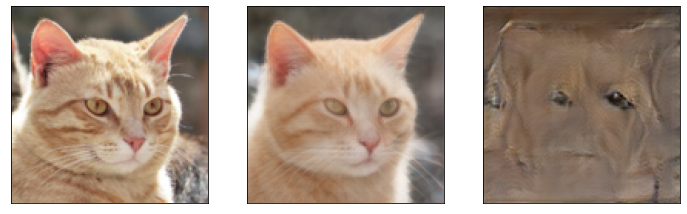

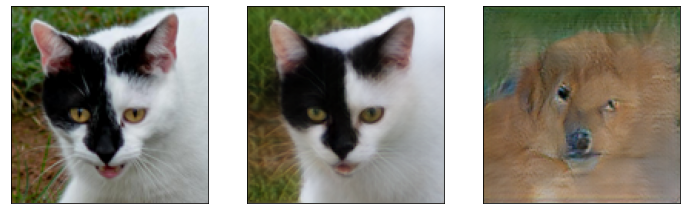

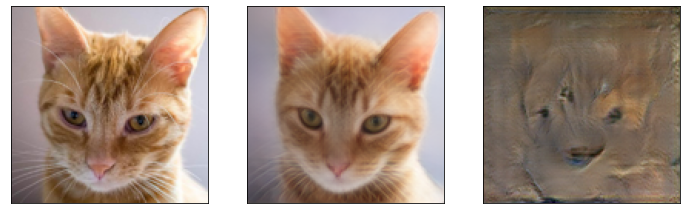

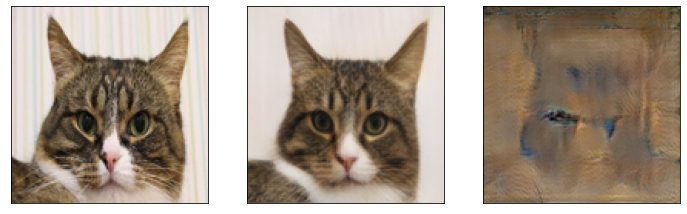

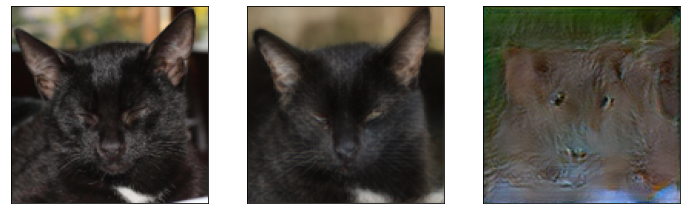

...

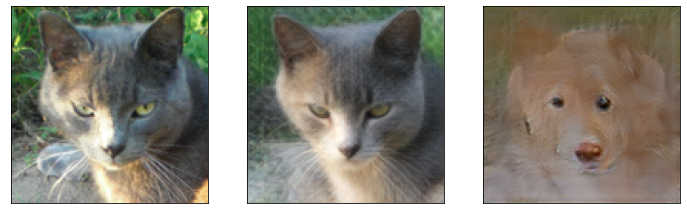

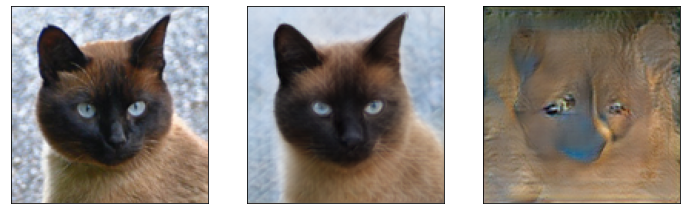

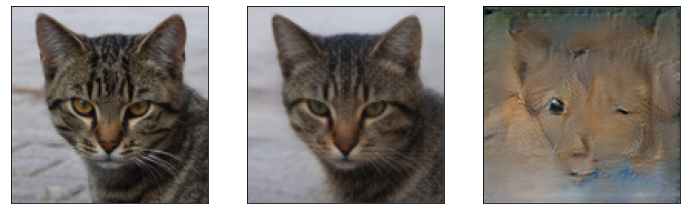

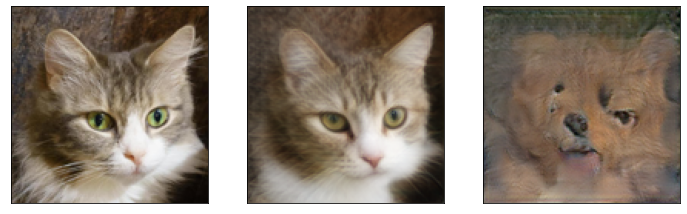

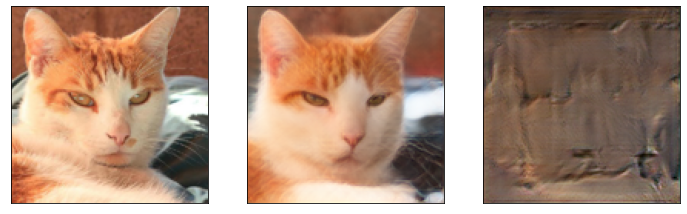

In [4]:
visualize(m, _class='A', img_size=128,dataset='afhq_cat2dog')

-----------------------------------------------------------------------------------------
|          original          |             rec             |         cross        |
-----------------------------------------------------------------------------------------


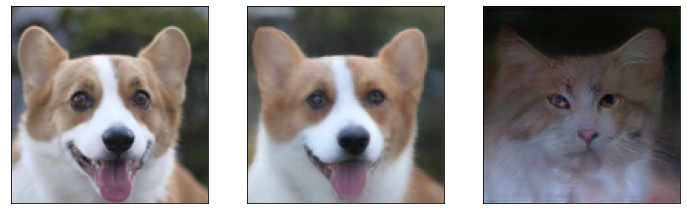

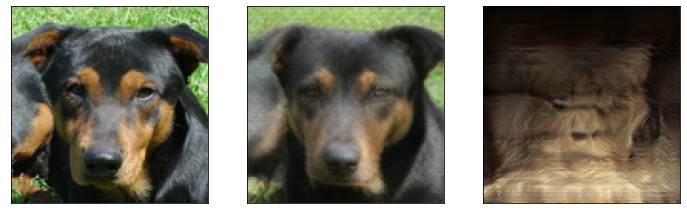

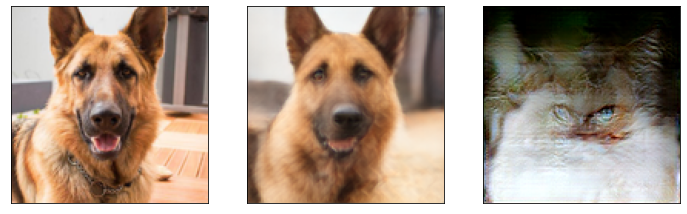

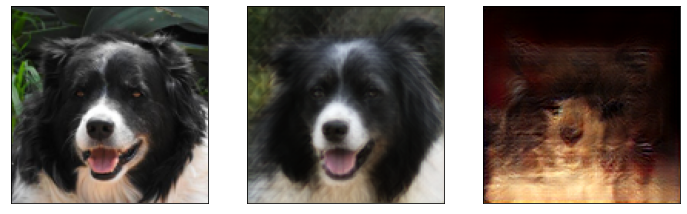

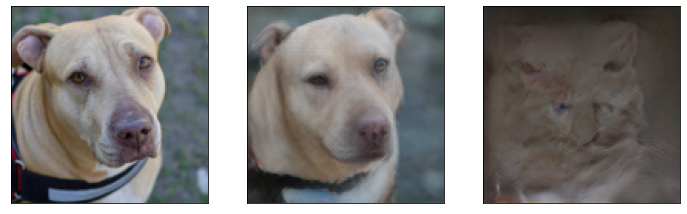

...

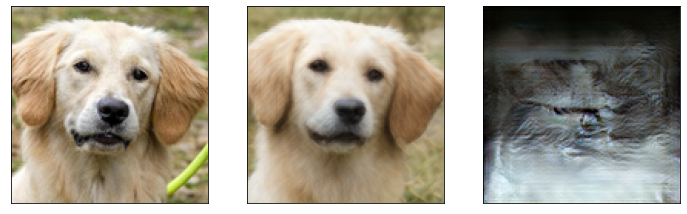

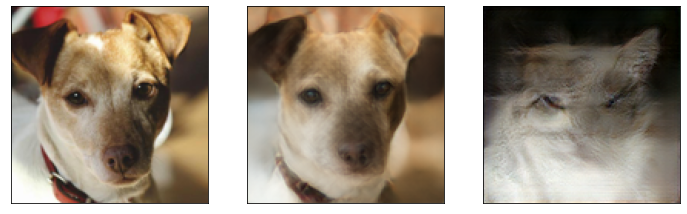

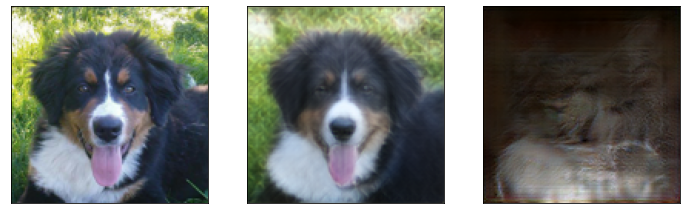

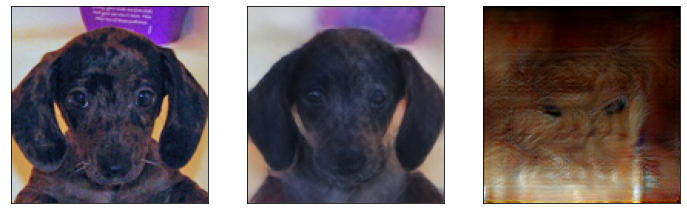

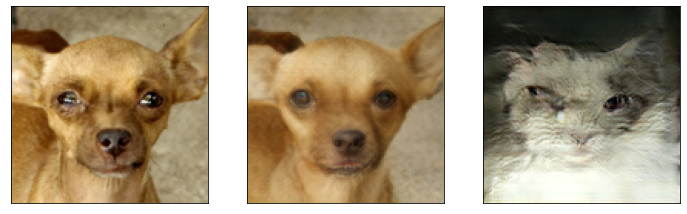

In [5]:
visualize(m, _class='B', img_size=128,dataset='afhq_cat2dog')

-------------------------------------------------------------------------------------------------------------
|       original_A         |         original_B         |  B content + A style    |  A content + B style    |
-------------------------------------------------------------------------------------------------------------


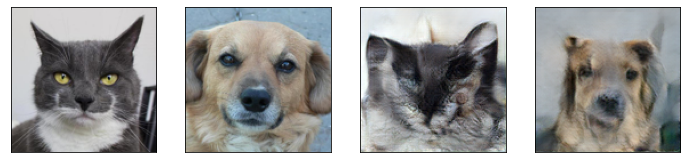

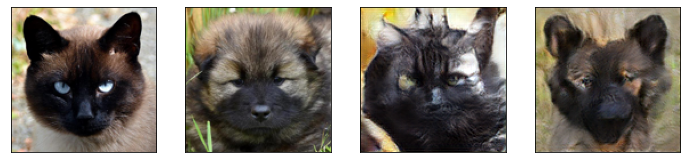

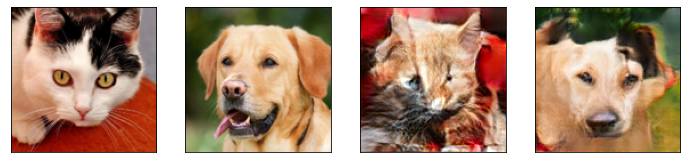

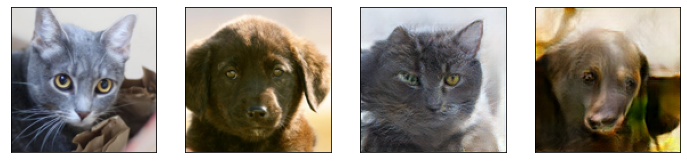

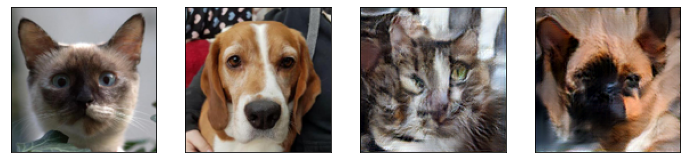

...

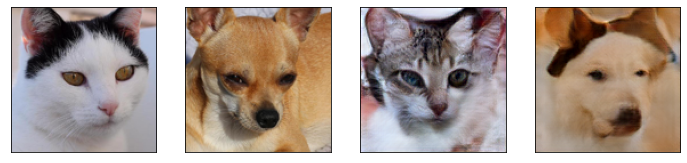

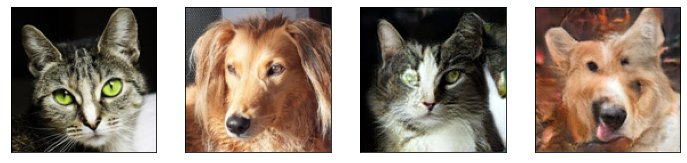

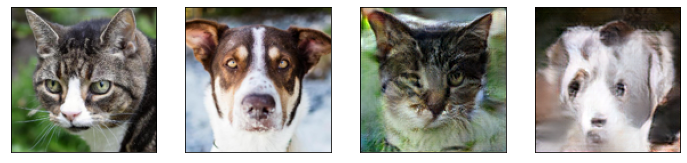

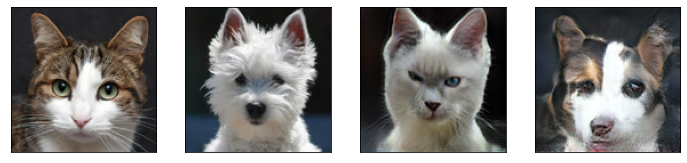

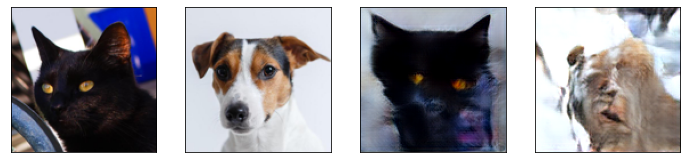

In [6]:
visualize_cross(m, img_size=128,dataset='afhq_cat2dog')